# Plausible-value check: `tas`, `tasmax`, `tasmin`, `pr`, `rsds`

This notebook checks whether the downscaled temperature, precipitation, and shortwave radiation
outputs stay inside a *location- and season-aware* plausible range. The global sanity bounds used
elsewhere (the "reasonable ranges" Check 3 in the [output-integrity notebook](output-integrity-checks.ipynb))
catch gross errors such as a mean temperature of 500 K, but they say nothing about values that are
globally ordinary yet locally impossible. A daily maximum of 25 °C is unremarkable in most of the
world, but in Antarctica in winter it should raise eyebrows.

To catch that second class of problem we build, for every grid cell and every day of the year, a
plausible envelope from the coarse GCM's modeled day-of-year variability (scenario relative to
historical) added to the observed ERA5 day-of-year envelope. We then ask, per leaf, what fraction of
the domain ever leaves that envelope, and by how much. The check is deliberately wide: it is meant to
flag suspect cells for inspection, not to fail a leaf on a single warm afternoon.

For precipitation the envelope is built the same additive way, but only its upper bound carries
information. Precipitation cannot go below zero, so the lower bound — the observed day-of-year
minimum plus the modeled change — is usually negative and so almost never flags a cell: in this run
it catches at most 0.003 % of the domain, and by no more than about 3 mm day⁻¹, in the persistently
wet cells where the observed day-of-year minimum sits above zero. The precipitation check therefore
measures how far the downscaled output rises above the wettest observed day plus the coarse model's
modeled increase. The same additive lower bound can go negative for any variable that is physically
nonnegative, so the variables with a hard floor (`pr`, `rsds`, `hurs`, and `dtr`) have their lower
bound floored at zero before comparison (see `NON_NEGATIVE_VARS` and `leaf_bounds` in Part 1). Exceedance magnitudes and map color scales are reported in the
units that make each variable easiest to judge rather than assuming kelvin throughout: kelvin for
`tas`/`tasmax`/`tasmin`, mm day⁻¹ for `pr`, and W m⁻² for `rsds`. The stored `pr` array keeps the
CMIP convention of kg m⁻² s⁻¹ and this notebook never rewrites it, but that unit is hard to reason
about: the largest precipitation exceedance in this run is 0.00996 kg m⁻² s⁻¹, which reads as a
formidable 860 mm day⁻¹. Multiplying by the 86400 seconds in a day is the entire conversion, because
the 1000 mm m⁻¹ and the 1000 kg m⁻³ density of water cancel, and it is applied only where numbers are
reported.

This regional run spans three GCMs (`CESM2-WACCM`, `MIROC-ES2H`, `UKESM`), each written to its own
icechunk store under the same branch. The notebook follows the structure of the output-integrity
notebook: open every GCM's store once, discover the `(gcm, scenario, variable, member)` leaves
programmatically, express every reduction lazily, and materialize them one `dask.compute` per
`(gcm, variable)` pair. That batching keeps each GCM's variables running in parallel instead of
one-at-a-time, and comparing every leaf to *its own* GCM's catalog and lineage — rather than one
GCM hardcoded for the whole run — is what makes the multi-model comparison correct rather than
silently wrong for two of the three GCMs.

In [1]:
import functools
import os
import pathlib
import time

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import coiled
import dask
import icechunk
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
import zarr
from icechunk.xarray import to_icechunk

from srm import catalog
from srm.cache import ArtifactCache
from srm.config import (
    ClusterConfig,
    _ensure_root_group,
    _icechunk_storage_for_path,
)
from srm.lineage import resolve_member_lineage
from srm.qaqc import find_exceedance_regions, obs_doy_bounds, scenario_delta_doy

os.environ["FRISKY_SUMMARY"] = "off"
from frisky import hijack

# NOTE: this notebook deliberately does NOT call dask_array.xarray.register(). Frisky's
# query-optimized array backend is incompatible with icechunk's distributed write path, which this
# notebook depends on to cache the day-of-year envelopes. icechunk builds its session-merge step
# with classic `dask.array`, so a `dask_array` collection reaching `da.reduction` gets re-wrapped
# ("Passing an object to dask.array.from_array which is already a Dask collection") and
# `icechunk.distributed.extract_session` then fails with
# "AttributeError: 'function' object has no attribute 'session'".
#
# The backend is global once registered and there is no way back to a classic array, so the write
# cannot be worked around locally. Sibling notebooks that only read may still call register().
# Frisky's client (`hijack` below) is unaffected and still used.

zarr.config.set({"async.concurrency": 128})

# --- Run parameters --------------------------------------------------------
# This regional South-Africa-box run covers three GCMs, each written to its own icechunk store
# (same bucket/branch, named by GCM the same way srm.cache.ArtifactCache names pipeline output
# stores). Looping over GCMS -- rather than hardcoding one, as this notebook used to -- is what
# lets every leaf be compared against ITS OWN GCM's catalog and lineage instead of silently
# reusing whichever GCM happened to be hardcoded.
GCMS = ("CESM2-WACCM", "MIROC-ES2H", "UKESM")
BRANCH = "full-regional-run-issue-534"

VARIABLES = ["tas", "tasmax", "tasmin", "pr", "rsds"]
SPATIAL = ["lat", "lon"]

# Bounds construction: obs baseline start year and day-of-year rolling window
# (window matches the srm.qaqc default).
OBS_START_YEAR = 1978
WINDOW = 30

# A leaf is flagged when more than this fraction of the domain leaves the envelope.
FLAG_THRESHOLD = 0.02

# How this run gets its numbers.
#
#   "full"   recompute the check from the source data. Reads the regional box for every GCM and
#            needs the Coiled cluster.
#   "cached" read the artifacts a previous "full" run committed. Needs no cluster at all.
#   "auto"   use "cached" when every artifact this notebook needs is already committed, else "full".
#
# The default is "auto" so that opening this notebook and running every cell does not quietly start
# VMs to recompute something already in the cache. Force "full" to regenerate the cache after the
# check itself changes, since the committed artifacts are not invalidated by edits to this notebook.
COMPUTE_MODE = "auto"

# Reporting units, applied only when a magnitude is printed or plotted -- the stored arrays keep
# the CMIP conventions untouched. Kelvin reads fine, but a precipitation rate in kg m-2 s-1 does
# not: 1e-4 kg m-2 s-1 is an ordinary wet day, so `pr` is reported in mm day-1. The factor is just
# the 86400 seconds in a day, since the 1000 mm m-1 and the 1000 kg m-3 density of water cancel.
# A variable absent from this map is reported in its stored units with a factor of 1.
DISPLAY_UNITS: dict[str, tuple[str, float]] = {"pr": ("mm day-1", 86400.0)}

# Per-leaf CSV + PNG artifacts (kept from the original notebook for downstream use).
QAQC_DIR = "/scratch/synced/qa_plots/plausible_value_check/"

# Optional fast path for a quick regional test run: set to (lat_slice, lon_slice)
# in the store's coordinate convention, or None to check the whole store domain.
# SUBSET = None
SUBSET = (slice(-38, -19), slice(13, 36))


def apply_subset(da: xr.DataArray) -> xr.DataArray:
    """Restrict to SUBSET for a fast regional test run; identity when SUBSET is None."""
    if SUBSET is None:
        return da
    lat_slice, lon_slice = SUBSET
    return da.sel(lat=lat_slice, lon=lon_slice)


# Bounds of the regional store itself (the box the pipeline ran, i.e. `subset_bounds` in
# configs/qa/*/*.yaml), used to build each GCM's output store URI the same way
# srm.cache.ArtifactCache names it. Distinct from SUBSET above, which further restricts *this
# notebook's* reads to a fast test window inside that box.
STORE_SUBSET_BOUNDS = (-38.0, -19.0, 13.0, 36.0)
STORE_SUBSET_ID = ArtifactCache._get_subset_id(STORE_SUBSET_BOUNDS)
BUCKET = "carbonplan-scratch"


def store_uri(gcm: str) -> str:
    return f"s3://{BUCKET}/srm/output/qa/{gcm}-ERA5-{STORE_SUBSET_ID}.icechunk"


# Artifact cache for the deep dive: an icechunk repository per GCM, named and branched exactly the
# way the pipeline names its own stores, {gcm}-{obs}-{subset}.icechunk on a branch named for the
# package version. Reusing that convention rather than a {BRANCH}/ path segment is what keeps
# "versioning is via icechunk branches, not path segments" true of these artifacts too. The subset
# id comes from ArtifactCache so the two cannot drift. This cache is per GCM even though the
# observed envelope inside it does not vary by GCM (see the cache-setup section below for why).
CACHE_SUBSET_BOUNDS = (
    None if SUBSET is None else (SUBSET[0].start, SUBSET[0].stop, SUBSET[1].start, SUBSET[1].stop)
)
CACHE_SUBSET_ID = ArtifactCache._get_subset_id(CACHE_SUBSET_BOUNDS)


def cache_store_uri(gcm: str) -> str:
    return f"s3://{BUCKET}/srm/qaqc/{gcm}-ERA5-{CACHE_SUBSET_ID}.icechunk"

## The output stores and leaf discovery

Each GCM's results live in their own icechunk store, versioned by branch and named the same way
`srm.cache.ArtifactCache` names pipeline output stores (`{gcm}-{obs}-{subset}.icechunk`). The
plausible-value check runs on the fine-grid downscaled outputs in the top-level scenario groups
(`historical`, `ssp245`, `g6_1p5k`); the coarse `debiased_coarse/…` subtree is only used later, in
the single-point drill-down. We open every GCM's store once as a datatree and discover the
`(gcm, scenario, variable, member)` leaves by walking its children, so there is no hand-maintained
list of runs to keep in sync with the stores. A GCM whose store or branch does not exist yet — its
run may still be in flight — is reported and skipped rather than failing the whole notebook.

In [4]:
trees: dict[str, xr.DataTree] = {}
open_errors: dict[str, str] = {}

for gcm in GCMS:
    try:
        repo = icechunk.Repository.open(_icechunk_storage_for_path(store_uri(gcm)))
        session = repo.readonly_session(BRANCH) if BRANCH else repo.readonly_session()
        trees[gcm] = xr.open_datatree(session.store, engine="zarr", chunks={})
    except Exception as exc:  # noqa: BLE001  # report every failure, do not stop at the first
        open_errors[gcm] = f"{type(exc).__name__}: {exc}"

for gcm, err in open_errors.items():
    print(f"FAILED to open {gcm}: {err}")

# GCMs whose store actually opened. A GCM whose run is still in flight is skipped here rather
# than failing the whole notebook, so this check can be run against a partially-landed run.
OPEN_GCMS = tuple(gcm for gcm in GCMS if gcm in trees)
print(f"opened {len(OPEN_GCMS)}/{len(GCMS)} stores on branch {BRANCH!r}: {', '.join(OPEN_GCMS)}")

trees[OPEN_GCMS[0]]

opened 3/3 stores on branch 'full-regional-run-issue-534': CESM2-WACCM, MIROC-ES2H, UKESM


<xarray.DataTree>
Group: /
├── Group: /debiased_coarse
│   ├── Group: /debiased_coarse/g6_1p5k
│   │   ├── Group: /debiased_coarse/g6_1p5k/dtr
│   │   │   ├── Group: /debiased_coarse/g6_1p5k/dtr/001
│   │   │   │       Dimensions:  (time: 18263, lat: 20, lon: 18)
│   │   │   │       Coordinates:
│   │   │   │         * time     (time) datetime64[ns] 146kB 2035-01-01 2035-01-02 ... 2084-12-31
│   │   │   │         * lat      (lat) float64 160B -37.23 -36.28 -35.34 ... -21.2 -20.26 -19.32
│   │   │   │         * lon      (lon) float64 144B 13.75 15.0 16.25 17.5 ... 31.25 32.5 33.75 35.0
│   │   │   │       Data variables:
│   │   │   │           dtr      (time, lat, lon) float32 26MB dask.array<chunksize=(8000, 8, 16), meta=np.ndarray>
│   │   │   │       Attributes: (12/17)
│   │   │   │           Conventions:                                 CF-1.8
│   │   │   │           institution:                                 CarbonPlan
│   │   │   │           history:                                     2026-08-05T07:32:10Z: BCSD d...
│   │   │   │           srm_downscaling:version:                     0.12.0.post17+g1393b8301.d20...
│   │   │   │           srm_downscaling:gcm:                         CESM2-WACCM
│   │   │   │           srm_downscaling:scenario:                    G6-1.5K
│   │   │   │           ...                                          ...
│   │   │   │           srm_downscaling:bias_correction_method:      nonparametric_hybrid_2sided
│   │   │   │           srm_downscaling:downscaling_method:          multiplicative
│   │   │   │           srm_downscaling:train_period:                1978-2014
│   │   │   │           srm_downscaling:config_hash:                 c26d582759c4
│   │   │   │           srm_downscaling:config_json:                 {"gcm":"CESM2-WACCM","variab...
│   │   │   │           srm_downscaling:creation_date:               2026-08-05
│   │   │   ├── Group: /debiased_coarse/g6_1p5k/dtr/002
│   │   │   │       Dimensions:  (time: 18263, lat: 20, lon: 18)
│   │   │   │       Coordinates:
│   │   │   │         * time     (time) datetime64[ns] 146kB 2035-01-01 2035-01-02 ... 2084-12-31
│   │   │   │         * lat      (lat) float64 160B -37.23 -36.28 -35.34 ... -21.2 -20.26 -19.32
│   │   │   │         * lon      (lon) float64 144B 13.75 15.0 16.25 17.5 ... 31.25 32.5 33.75 35.0
│   │   │   │       Data variables:
│   │   │   │           dtr      (time, lat, lon) float32 26MB dask.array<chunksize=(8000, 8, 16), meta=np.ndarray>
│   │   │   │       Attributes: (12/17)
│   │   │   │           Conventions:                                 CF-1.8
│   │   │   │           institution:                                 CarbonPlan
│   │   │   │           history:                                     2026-08-05T07:32:08Z: BCSD d...
│   │   │   │           srm_downscaling:version:                     0.12.0.post17+g1393b8301.d20...
│   │   │   │           srm_downscaling:gcm:                         CESM2-WACCM
│   │   │   │           srm_downscaling:scenario:                    G6-1.5K
│   │   │   │           ...                                          ...
│   │   │   │           srm_downscaling:bias_correction_method:      nonparametric_hybrid_2sided
│   │   │   │           srm_downscaling:downscaling_method:          multiplicative
│   │   │   │           srm_downscaling:train_period:                1978-2014
│   │   │   │           srm_downscaling:config_hash:                 596ec3000e4f
│   │   │   │           srm_downscaling:config_json:                 {"gcm":"CESM2-WACCM","variab...
│   │   │   │           srm_downscaling:creation_date:               2026-08-05
│   │   │   └── Group: /debiased_coarse/g6_1p5k/dtr/003
│   │   │           Dimensions:  (time: 18263, lat: 20, lon: 18)
│   │   │           Coordinates:
│   │   │             * time     (time) datetime64[ns] 146kB 2035-01-01 2035-01-02 ... 2084-12-31
│   │   │             * lat      (lat) float64 160B -37.23 -36.28 -35.34 ... -21.2 -20.26 -19.32
│ 

In [5]:
# Store groups and lineage labels differ: the store (and the raw GCM catalog) key scenarios as
# lowercase group names, while srm.lineage keys them by label. This map bridges the two.
SCENARIO_LABELS = {"historical": "historical", "ssp245": "SSP245", "g6_1p5k": "G6-1.5K"}


def group_leaves(gcm: str, group: str) -> dict[tuple[str, str, str, str], xr.DataArray]:
    """One lazy fine-grid DataArray per (gcm, group, variable, member) present under trees[gcm][group]."""
    node = trees[gcm][group]
    return {
        (gcm, group, v, m): node[f"{v}/{m}"].dataset[v]
        for v in VARIABLES
        if v in node.children
        for m in node[v].children
    }


leaves: dict[tuple[str, str, str, str], xr.DataArray] = {}
for gcm in OPEN_GCMS:
    for group in SCENARIO_LABELS:
        leaves.update(group_leaves(gcm, group))


def leaves_for(gcm: str) -> dict[tuple[str, str, str], xr.DataArray]:
    """This GCM's leaves, reduced to the (scenario, variable, member) keys the shared
    srm.plotting helpers (point_series, plot_point_panels) expect -- they are GCM-agnostic
    functions, so the GCM is fixed by the caller rather than threaded through their key."""
    return {key[1:]: da for key, da in leaves.items() if key[0] == gcm}


def display_units(var: str) -> tuple[str, float]:
    """(label, multiplier) for reporting a variable, from DISPLAY_UNITS.

    Variables not listed there fall back to the units recorded in the store's variable attrs and a
    multiplier of 1, so every magnitude in this notebook — summary table, CSVs, map color bars,
    drill-down axes — is scaled and labeled the same way from one place.
    """
    if var in DISPLAY_UNITS:
        return DISPLAY_UNITS[var]
    stored = next(da.attrs.get("units", "") for (_, _, v, _), da in leaves.items() if v == var)
    return stored, 1.0


def table(rows: dict) -> pd.DataFrame:
    """One row per leaf, indexed by (gcm, scenario, variable, member)."""
    return pd.DataFrame.from_dict(rows, orient="index").rename_axis(
        ["gcm", "scenario", "variable", "member"]
    )


print(f"{len(leaves)} (gcm, scenario, variable, member) leaves discovered:")
for gcm in OPEN_GCMS:
    n = sum(1 for key in leaves if key[0] == gcm)
    print(f"  {gcm}: {n} leaves")

226 (gcm, scenario, variable, member) leaves discovered:
  CESM2-WACCM: 66 leaves
  MIROC-ES2H: 115 leaves
  UKESM: 45 leaves


## The deep-dive artifact cache

Part 1 below is expensive and needs a large cluster, but almost everything it computes is thrown away
when the kernel exits. The summary CSVs keep four scalars per leaf, which is enough to say *whether* a
leaf is flagged and nothing about *where*. This section persists the two results that make the
follow-up investigation cheap, so the "Single-leaf deep dive" can run on its own without a cluster.

| Artifact | Group | Shape | Size |
|---|---|---|---|
| Per-leaf exceedance maps | `stats/{scenario}_{variable}_{member}` | `over`/`under` 2-D plus four scalars | ~8 MB per leaf |
| Observed day-of-year envelope | `envelope/{variable}` | `low`/`high`, `(dayofyear, lat, lon)` | ~3 GB per variable |

Only the observed envelope is cached, not each leaf's plausible bound. The bound is the envelope plus
a coarse-grid scenario delta, and that delta is cheap enough to rebuild per leaf, so caching it per
leaf would multiply the storage by the number of leaves for no saving.

Each GCM gets its own cache store (`{gcm}-ERA5-{subset}.icechunk`, mirroring the output store's own
naming), so one GCM's envelope and leaf maps never collide with another's, and the cache section below
is opened once per GCM in a loop. The ERA5 observed envelope itself is identical across GCMs — it
depends only on the variable, never on the GCM — but is still committed once per GCM, since each
GCM's cache is a separate store with nothing to share into. That trades one extra ~70 GB envelope
reduction per extra GCM for keeping every GCM's cache self-contained; see the cluster sizing note in
"Compute" below for where that cost shows up.

In [6]:
# Chunking for the cached envelope. The spatial entries match what obs_doy_bounds already
# produces, so they are a no-op. `dayofyear: -1` is a real rechunk: periodic_rolling pads then
# slices, leaving dayofyear split unevenly (338, 28 for a 30-day window). Consolidating it is
# cheap because it concatenates *within* each lat/lon block rather than shuffling across them,
# and it makes a later single-point read fetch one chunk instead of two.
ENVELOPE_CHUNKS = {"dayofyear": -1, "lat": 180, "lon": 360}

# One cache repo per GCM, each opened/created and branched the same way. The observed ERA5
# envelope inside each is identical across GCMs -- it depends only on the variable, never on the
# GCM -- but it is still committed once per GCM rather than shared, because sharing it would mean
# one GCM's cache store reading and writing into another's. That trades one extra ~70 GB envelope
# reduction per extra GCM for keeping every GCM's cache self-contained; see "Compute" below for
# where that cost shows up in the cluster sizing.
cache_repos: dict[str, icechunk.Repository] = {}
for gcm in OPEN_GCMS:
    repo = icechunk.Repository.open_or_create(_icechunk_storage_for_path(cache_store_uri(gcm)))
    if BRANCH not in repo.list_branches():
        repo.create_branch(BRANCH, repo.lookup_branch("main"))
    # A branch cut from the root snapshot carries no root group at all, so the first writers to two
    # different groups would each try to create it and their commits could not rebase
    # (NewNodeConflictsWithExistingNode at "/"). See issue #521.
    _ensure_root_group(repo, BRANCH)
    cache_repos[gcm] = repo


def envelope_group(var: str) -> str:
    return f"envelope/{var}"


def stats_group(key: tuple[str, str, str]) -> str:
    """key is (scenario, variable, member) -- the GCM is implicit in which cache_repos[gcm]
    store this runs against, so it does not need to appear in the group path too."""
    return f"stats/{'_'.join(key)}"


def cached_groups(gcm: str) -> set[str]:
    """Every group currently committed on gcm's cache branch.

    This is the cache's only existence test, and it is exact rather than approximate. A write
    becomes visible only when its commit lands, so a run that died mid-write leaves nothing here
    to mistake for a finished artifact, and no completion marker is needed to tell them apart.
    """
    session = cache_repos[gcm].readonly_session(BRANCH)
    tree = xr.open_datatree(session.store, engine="zarr", chunks={})
    return {str(group).lstrip("/") for group in tree.groups}


def envelope_cached(gcm: str, var: str) -> bool:
    """True when a variable's envelope is committed for this GCM, so a rerun can skip recomputing it."""
    return envelope_group(var) in cached_groups(gcm)


def save_doy_envelope(gcm: str, low: xr.DataArray, high: xr.DataArray, var: str) -> str:
    """Commit a variable's observed day-of-year envelope to gcm's cache, returning the snapshot id.

    An ordinary eager write followed by a commit. There is deliberately no deferred variant:
    Part 1 commits the envelope before running that (gcm, variable)'s leaves and the leaves read
    it back, so the expensive reduction never sits inside the batch graph and there is nothing to
    fuse a write into.
    """
    envelope = xr.Dataset({"low": low, "high": high})
    envelope = envelope.chunk({d: n for d, n in ENVELOPE_CHUNKS.items() if d in envelope.dims})
    envelope.attrs["variable"] = var
    session = cache_repos[gcm].writable_session(BRANCH)
    to_icechunk(envelope, session, group=envelope_group(var), mode="w")
    return session.commit(f"cache {gcm} {var} day-of-year envelope")


def load_doy_envelope(gcm: str, var: str) -> tuple[xr.DataArray, xr.DataArray]:
    """Read gcm's cached (low, high) observed envelope back, lazily.

    The arrays keep their on-disk chunking, so selecting one grid cell later fetches a single
    chunk instead of the whole ~3 GB envelope. Leaving them lazy is deliberate rather than
    incidental: materializing the envelope here would defeat the point of caching it.
    """
    if not envelope_cached(gcm, var):
        raise FileNotFoundError(
            f"no committed envelope for {var!r} in {cache_store_uri(gcm)} on branch {BRANCH}. Run "
            f"Part 1 for {gcm} on this branch, which caches it. If Part 1 reported {(gcm, var)!r} "
            "as having no checkable leaves, or as failing after retries, it never wrote this "
            "envelope and rerunning it unchanged will not help -- fix that leaf's lineage or the "
            "failure first."
        )
    session = cache_repos[gcm].readonly_session(BRANCH)
    envelope = xr.open_zarr(session.store, group=envelope_group(var), chunks={})
    return envelope["low"], envelope["high"]


def save_exceedance_maps(gcm: str, gcm_stats: dict) -> str:
    """Commit gcm's leaf exceedance maps and scalar metrics in one snapshot.

    `gcm_stats` is already computed and pre-filtered to this GCM, keyed by (scenario, variable,
    member), so this recomputes nothing. Each leaf is a few MB: the two 2-D maps saying *where* it
    leaves its envelope, which the summary CSVs do not record. One commit covers gcm's whole set,
    so its cached maps are either all present for a run or none are.
    """
    session = cache_repos[gcm].writable_session(BRANCH)
    for key, leaf in gcm_stats.items():
        out = leaf.copy()
        # Carry the identity in attrs so a load rebuilds the keys without parsing group names.
        out.attrs.update(scenario=key[0], variable=key[1], ensemble_member=key[2])
        to_icechunk(out, session, group=stats_group(key), mode="w")
    return session.commit(f"cache {gcm} exceedance maps for {len(gcm_stats)} leaf(s)")


def load_exceedance_maps(gcm: str, keys: list | None = None) -> dict:
    """Read gcm's cached per-leaf exceedance maps into memory.

    `keys`, if given, are the notebook-wide (gcm, scenario, variable, member) keys; only the ones
    matching `gcm` make sense here and the (scenario, variable, member) tail is what addresses the
    group. Returns {(gcm, scenario, variable, member): Dataset}, the same shape Part 1 produces
    across every GCM, so the plotting helpers consume it unchanged. keys=None loads every leaf
    cached for this GCM. The maps are a few MB each, so these are loaded eagerly rather than left lazy.
    """
    groups = cached_groups(gcm)
    if keys is None:
        wanted = sorted(g for g in groups if g.startswith("stats/"))
        if not wanted:
            raise FileNotFoundError(
                f"no cached exceedance maps in {cache_store_uri(gcm)} on branch {BRANCH} -- "
                f"run Part 1 for {gcm} first"
            )
    else:
        wanted = [stats_group(key[1:]) for key in keys]
        missing = [g for g in wanted if g not in groups]
        if missing:
            raise FileNotFoundError(
                f"no cached exceedance maps for {gcm}: "
                + ", ".join(missing)
                + " -- run Part 1 first"
            )

    session = cache_repos[gcm].readonly_session(BRANCH)
    loaded = {}
    for group in wanted:
        leaf = xr.open_zarr(session.store, group=group).load()
        key = (gcm, leaf.attrs["scenario"], leaf.attrs["variable"], leaf.attrs["ensemble_member"])
        loaded[key] = leaf
    return loaded


print("Deep-dive cache, one store per GCM:")
for gcm in OPEN_GCMS:
    print(f"  {gcm}: {cache_store_uri(gcm)}")
    _cached = cached_groups(gcm)
    for _var in VARIABLES:
        print(
            f"    envelope/{_var}: {'cached' if envelope_group(_var) in _cached else 'not cached'}"
        )
    print(f"    cached leaf maps: {sum(1 for g in _cached if g.startswith('stats/'))}")

Deep-dive cache, one store per GCM:
  CESM2-WACCM: s3://carbonplan-scratch/srm/qaqc/CESM2-WACCM-ERA5-lat-38to-19_lon13to36.icechunk
    envelope/tas: not cached
    envelope/tasmax: not cached
    envelope/tasmin: not cached
    envelope/pr: not cached
    envelope/rsds: not cached
    cached leaf maps: 0
  MIROC-ES2H: s3://carbonplan-scratch/srm/qaqc/MIROC-ES2H-ERA5-lat-38to-19_lon13to36.icechunk
    envelope/tas: not cached
    envelope/tasmax: not cached
    envelope/tasmin: not cached
    envelope/pr: not cached
    envelope/rsds: not cached
    cached leaf maps: 0
  UKESM: s3://carbonplan-scratch/srm/qaqc/UKESM-ERA5-lat-38to-19_lon13to36.icechunk
    envelope/tas: not cached
    envelope/tasmax: not cached
    envelope/tasmin: not cached
    envelope/pr: not cached
    envelope/rsds: not cached
    cached leaf maps: 0


## Compute

Which resources this run needs depends entirely on where its numbers come from, so that decision is
made here rather than assumed. A `full` run reads the regional (South-Africa-box) fine-grid
temperature, precipitation, and shortwave radiation arrays out of S3 for every open GCM, so it wants
a distributed [Coiled](https://coiled.io) cluster in `us-west-2` alongside the data. A `cached` run
reads a few committed artifacts instead and does its work in the kernel, so creating a cluster for it
would cost money and wall-clock time for nothing.

`COMPUTE_MODE` in the parameters cell selects between them, and `auto` resolves to `cached` whenever
the artifacts for every open GCM are already committed. The cache state is known by this point, which
is why this section sits after the cache rather than before it: the decision needs to see what is on
each GCM's branch.

| Mode | Reads | Cluster | Typical use |
|---|---|---|---|
| `full` | the regional box for every open GCM (this cell prints the actual GiB total) | a small fixed on-demand pool | once per store version, to produce the cache |
| `cached` | a few MB of committed artifacts | none | every investigation afterwards |

This is a regional run, not the ~2 TB global read `srm.config.ClusterConfig`'s own defaults
(`n_workers=30`, `r8g.8xlarge`) are sized for, so this cell uses a much smaller fixed pool instead and
prints the actual read volume across every checkable leaf so that sizing can be checked rather than
assumed. The cluster settings still mirror `srm.config.ClusterConfig`'s shape, but pin a *fixed*,
*on-demand* worker pool rather than an adaptive spot one, for the same reason as the global run: this
check is a long `groupby`-reduce per `(gcm, variable)` batch, and a worker that disappears mid-run,
through spot reclamation or an adaptive downscale, discards reduction partials that `frisky` cannot
recompute. The client is wrapped with `frisky` so progress stays visible while the reductions run.

In [7]:
def cache_status() -> tuple[bool, list[str]]:
    """(is_complete, missing) for the artifacts a cached run needs, across every open GCM.

    A cached run needs every checkable (gcm, variable)'s envelope plus at least one committed
    leaf map per GCM. Reporting what is missing rather than a bare boolean is what lets the mode
    resolution below explain itself instead of silently choosing the expensive path.
    """
    missing = []
    wanted_vars_by_gcm: dict[str, set[str]] = {}
    for gcm, _, var, _ in checkable_preview():
        wanted_vars_by_gcm.setdefault(gcm, set()).add(var)
    for gcm in OPEN_GCMS:
        groups = cached_groups(gcm)
        for var in sorted(wanted_vars_by_gcm.get(gcm, set())):
            if envelope_group(var) not in groups:
                missing.append(f"{gcm}/{envelope_group(var)}")
        if not any(g.startswith("stats/") for g in groups):
            missing.append(f"{gcm}/stats/* (no leaf maps committed)")
    return not missing, missing


def checkable_preview() -> list[tuple[str, str, str, str]]:
    """Leaves this notebook would check, without needing Part 1's lineage resolution yet.

    Only the variables matter here, and lineage resolution happens in Part 1, so this deliberately
    does not filter on it: a variable whose leaves are all unregistered would otherwise make the
    cache look incomplete forever.
    """
    return [key for key in leaves if key[2] in VARIABLES]


_cache_complete, _cache_missing = cache_status()

if COMPUTE_MODE not in {"auto", "full", "cached"}:
    raise ValueError(f"COMPUTE_MODE must be 'auto', 'full', or 'cached', got {COMPUTE_MODE!r}")
if COMPUTE_MODE == "auto":
    RESOLVED_MODE = "cached" if _cache_complete else "full"
else:
    RESOLVED_MODE = COMPUTE_MODE

# An explicit "cached" with an incomplete cache must fail here rather than fall through to a large
# reduction on a kernel with no cluster behind it. That is the whole hazard this cell exists to close.
if RESOLVED_MODE == "cached" and not _cache_complete:
    raise RuntimeError(
        "COMPUTE_MODE='cached' but the cache is missing: "
        + ", ".join(_cache_missing)
        + f"\nRun this notebook once with COMPUTE_MODE='full' on branch {BRANCH} to produce it."
    )

print(f"COMPUTE_MODE={COMPUTE_MODE!r} -> {RESOLVED_MODE!r}")
if _cache_missing:
    print(f"  cache incomplete, missing: {', '.join(_cache_missing)}")

if RESOLVED_MODE == "full":
    _preview_keys = checkable_preview()
    _preview_gib = sum(leaves[key].nbytes for key in _preview_keys) / 2**30
    print(
        f"  full run reads ~{_preview_gib:.0f} GiB across {len(_preview_keys)} checkable-preview "
        f"leaf(s) over {len(OPEN_GCMS)} GCM(s) (before lineage filtering)"
    )

    # This is a regional (South-Africa-box) run, two-plus orders of magnitude smaller than the
    # global ~2 TB read srm.config.ClusterConfig's own defaults (30x r8g.8xlarge) are sized for --
    # the printed GiB total above confirms that for this box. A fixed, on-demand pool this much
    # smaller still comfortably outruns that read volume; re-check the printed total and scale up
    # if it grows (e.g. VARIABLES or GCMS widens, or SUBSET is loosened). The fixed/on-demand
    # policy itself still matters at any size, for the same reason as the global run: this check is
    # one long groupby-reduce per (gcm, variable) batch, and a worker that disappears mid-run,
    # through spot reclamation or an adaptive downscale, discards reduction partials that `frisky`
    # cannot recompute.
    cfg = ClusterConfig(
        n_workers=6,
        worker_vm_types=["r8g.4xlarge"],
        scheduler_vm_types=["r8g.xlarge"],
        spot_policy="on-demand",
    )
    cluster = coiled.Cluster(
        name="srm-qaqc-plausible-check-regional",
        region=cfg.region,
        n_workers=cfg.n_workers,
        worker_vm_types=cfg.worker_vm_types,
        scheduler_vm_types=cfg.scheduler_vm_types,
        spot_policy=cfg.spot_policy,
        use_best_zone=True,
        tags=cfg.tags,
        worker_disk_size=250,
    )
    client = hijack(cluster.get_client())
else:
    # Cached runs read megabytes and reduce nothing, so the kernel's own threads are enough. Leaving
    # these None is also what lets the shutdown cell at the end stay honest about there being
    # nothing to tear down.
    cluster = client = None
    dask.config.set(scheduler="threads")
    print("  no cluster created; using the kernel's threaded scheduler")

client

╭─────────────────────────────── Coiled Cluster ───────────────────────────────╮
│                   ]8;id=6455214;https://cloud.coiled.io/clusters/1896619\https://cloud.coiled.io/clusters/1896619]8;;\                   │
╰──────────────────────────────────────────────────────────────────────────────╯
╭────────────── Overview ──────────────╮╭─────────── Configuration ────────────╮
│                                      ││                                      │
│ Name:                                ││ Region: us-west-2                    │
│ srm-qaqc-plausible-check-regional    ││                                      │
│                                      ││ Scheduler: r8g.xlarge                │
│ Scheduler Status: started            ││                                      │
│                                      ││ Workers:   r8g.4xlarge (6)           │
│ Dashboard:                           ││                                      │
│ ]8;id=6455217;https://cluster-kxunh.dask.host?token=xCpbb7n8I9xEfVuz\https://cluster-kxunh.dask.host?toke]8;;\ ││ Workers Requested: 6                 │
│ ]8;id=6455217;https://cluster-kxunh.dask.host?token=xCpbb7n8I9xEfVuz\n=xCpbb7n8I9xEfVuz]8;;\                   ││                                      │
╰──────────────────────────────────────╯╰──────────────────────────────────────╯
╭───────────────────────── (2026/08/07 18:38:02 UTC) ──────────────────────────╮
│                                                                              │
│                              All workers ready.                              │
│                                                                              │
│                                                                              │
╰──────────────────────────────────────────────────────────────────────────────╯

<frisky.Client: scheduler="wss://cluster-kxunh.dask.host/xCpbb7n8I9xEfVuz/frisky-comm?__frisky_dial_host=16.144.33.231" id="client-0">

## Part 1 — the plausible-range check

For each leaf we build a per-day-of-year plausible envelope and measure how far the downscaled output
strays from it. The envelope has two ingredients that live on different grids and cost very different
amounts to compute. The observed piece, `obs_doy_bounds`, is the ERA5 day-of-year min/max envelope on
the fine grid; it is the expensive part, but it depends only on the variable, so we compute it once
per variable and share it across every scenario and member. The scenario piece, `scenario_delta_doy`,
is the coarse GCM's day-of-year change relative to the historical mean; it is cheap and genuinely
per-leaf, and we regrid it onto the observation grid (nearest neighbor) before adding it to the
observed envelope.

The historical baseline member for each leaf comes from `srm.lineage` rather than a hand-written
table — for the SAI and SSP245 scenarios `tas` and the extrema are drawn from different historical
runs, exactly the split the integrity notebook documents. Each leaf's reductions are defined lazily
in `plausibility_stats`, and because every leaf of a given variable references the *same* lazy
`obs_doy_bounds` object, that variable's `dask.compute` evaluates the shared observed envelope only
once.

In [8]:
# One coarse-GCM catalog datatree per open GCM, keyed the same as GCMS/OPEN_GCMS. Using each
# leaf's own GCM here (instead of one hardcoded GCM) is what makes the multi-model comparison
# correct: a UKESM leaf's scenario delta and historical baseline must come from the UKESM catalog,
# not CESM2-WACCM's.
CATALOGS = {gcm: catalog.get(gcm).to_xarray() for gcm in OPEN_GCMS}
ERA5 = catalog.get("ERA5").to_xarray()  # shared: observations don't depend on the GCM

# Variables whose plausible lower bound is clamped at zero, because a negative precipitation rate,
# downwelling shortwave flux, relative humidity, or diurnal temperature range is not a physically
# meaningful lower bound. This mirrors the zero-bounded set the pipeline itself uses when choosing a
# distribution for the bias correction (`src/srm/pipeline.py`, `_WeibullMinZeroBounded`), so the check
# and the pipeline agree on which variables have a hard floor. `dtr` is included for that reason even
# though VARIABLES above does not currently check it.
NON_NEGATIVE_VARS = ["pr", "rsds", "hurs", "dtr"]


def obs_fine(var: str) -> xr.DataArray:
    """Fine-grid ERA5 observations for a variable, from OBS_START_YEAR onward.

    Shared across every GCM: ERA5 does not depend on which GCM a leaf came from.
    """
    da = ERA5[var]
    da = da.sel(time=slice(str(OBS_START_YEAR), None))
    return apply_subset(da)


@functools.cache
def obs_bounds_cached(var: str) -> tuple[xr.DataArray, xr.DataArray]:
    """(low, high) observed day-of-year envelope for a variable, lazily.

    This is the expensive ingredient, and Part 1 now uses it in exactly one place: to compute the
    envelope once per GCM so it can be committed to that GCM's cache. Everything downstream reads
    the committed copy back through `load_doy_envelope` instead, so this graph never becomes part
    of a leaf batch. Do NOT persist it under frisky: frisky's persist gathers the result to the
    client (not the cluster) and the ~3 GB envelope overflows its ws proxy buffer.

    The memoization is on the lazy *graph* and keyed only on `var` (not `gcm`), because the
    envelope genuinely does not depend on the GCM -- it dedupes the graph construction within a
    single kernel across every GCM's commit of the same variable, but each GCM's `dask.compute`
    still evaluates it separately, since each writes to its own cache store. Cross-session reuse is
    the cache's job, not this decorator's."""
    return obs_doy_bounds(obs_fine(var), window=WINDOW)


def historical_member(gcm: str, scenario: str, var: str, member: str) -> str:
    """Historical baseline member for a leaf. The historical group has no scenario lineage, so its
    baseline is the leaf's own member; scenarios resolve through srm.lineage (raises KeyError if the
    combination is not registered for this GCM)."""
    if scenario == "historical":
        return member
    return resolve_member_lineage(gcm, SCENARIO_LABELS[scenario], member, var).historical


def leaf_bounds(
    key: tuple[str, str, str, str], low_obs: xr.DataArray, high_obs: xr.DataArray
) -> tuple[xr.DataArray, xr.DataArray]:
    """Fine-grid plausible bounds for one leaf, given an observed day-of-year envelope.

    The envelope has two ingredients with very different costs, and this function is the seam
    between them. `low_obs`/`high_obs` are the expensive per-variable piece, supplied by the
    caller: `obs_bounds_cached` when running the full check, or the artifact cache in the deep
    dive. The scenario delta added here is coarse-grid and cheap, so it is always recomputed, from
    `key`'s own GCM's catalog.

    Both the check and the deep dive route through this one function, so the bound they compare
    against, clamp included, cannot drift apart. That matters because the two arrive at the
    observed envelope by different routes, and a divergence here would silently make the deep dive
    flag a different set of cells than the summary table it is supposed to explain.
    """
    gcm, scenario, var, member = key
    gcm_tree = CATALOGS[gcm]
    raw_scenario = apply_subset(gcm_tree[scenario][var].sel(ensemble_member=member))
    raw_historical = apply_subset(
        gcm_tree["historical"][var].sel(
            ensemble_member=historical_member(gcm, scenario, var, member)
        )
    )
    delta_low, delta_high = scenario_delta_doy(raw_scenario, raw_historical, window=WINDOW)

    # Nearest-neighbor coarse -> fine regrid via reindex, not interp. The two are numerically
    # identical for nearest selection, and reindex is pure indexing rather than a trip through
    # apply_ufunc, so it stays cheap and keeps the graph simple. It was originally required
    # because interp mixed classic dask arrays with the query-planning (dask_array) backend and
    # raised "Mixing chunked array types"; this notebook no longer registers that backend (see the
    # note in the imports cell), but reindex remains the better choice on its own merits.
    regrid = {"lat": low_obs["lat"], "lon": low_obs["lon"], "method": "nearest"}
    high_bound = high_obs + delta_high.reindex(**regrid)
    low_bound = low_obs + delta_low.reindex(**regrid)

    if var in NON_NEGATIVE_VARS:
        low_bound = low_bound.where(low_bound > 0, 0)
    return low_bound, high_bound


def plausibility_stats(
    key: tuple[str, str, str, str], low_obs: xr.DataArray, high_obs: xr.DataArray
) -> xr.Dataset:
    """Lazy per-leaf plausibility reductions, fused into one pass over the array on compute.

    `low_obs`/`high_obs` are the variable's observed envelope, which the caller supplies from the
    cache. Taking it as an argument rather than building it here is what keeps the observation
    record reduction out of this graph, and it is why the leaf batches stay small.
    """
    downscaled = apply_subset(leaves[key])
    low_bound, high_bound = leaf_bounds(key, low_obs, high_obs)

    doy_max = downscaled.groupby("time.dayofyear").max("time")
    doy_min = downscaled.groupby("time.dayofyear").min("time")
    over = (doy_max - high_bound).max(
        "dayofyear"
    )  # stored units above the high bound (per cell, 2-D)
    under = (doy_min - low_bound).min(
        "dayofyear"
    )  # stored units below the low bound (per cell, 2-D)

    return xr.Dataset(
        {
            "over": over,
            "under": under,
            "frac_area_too_high": (over > 0).mean(SPATIAL),
            "frac_area_too_low": (under < 0).mean(SPATIAL),
            "diff_gt_doy_max": over.max(),
            "diff_lt_doy_min": under.min(),
        }
    )


# Resolve historical baselines up front; skip (rather than fabricate) any leaf whose lineage is not
# registered for its own GCM, so a lineage gap surfaces instead of silently using the wrong
# historical member or, as this notebook's single-GCM predecessor did, the wrong GCM's lineage
# table entirely.
checkable, skipped = {}, []
for key in leaves:
    gcm, scenario, var, member = key
    try:
        historical_member(gcm, scenario, var, member)
        checkable[key] = leaves[key]
    except KeyError:
        skipped.append(key)
if skipped:
    print("Skipped (no registered lineage):")
    for key in skipped:
        print("  " + "/".join(key))

### Running the check

We materialize the reductions one `(gcm, variable)` pair at a time so each batch shares that
GCM/variable's observed envelope (computing it once per GCM) while bounding peak cluster memory and
graph size to a single GCM's single variable, and a failed batch costs one `(gcm, variable)` pair
rather than the whole run. The scalar metrics from every leaf, across every GCM, collapse into one
summary table: the fraction of the domain that is ever too high or too low, the largest exceedance in
each direction, and a pass flag using the same 2 % threshold the original notebook used. The
magnitudes are converted to each variable's reporting units before they are rounded — kelvin for
temperature, mm day⁻¹ for precipitation, W m⁻² for shortwave radiation — and the `units` column names
the unit each row is expressed in. Rounding after the conversion rather than before it matters more
than it looks: three decimals of kg m⁻² s⁻¹ quantize precipitation to steps of about 86 mm day⁻¹,
coarse enough to print two leaves that genuinely differ by 12 mm day⁻¹ as the same number.

In a cached run this cell computes nothing at all: it loads the committed leaf maps for every open
GCM, which carry the same arrays and scalars, and the summary below is built from those. Everything
after it behaves identically either way, which is what keeps one notebook honest in both modes.

In a full run, this cell is also where the deep-dive cache is written. Each `(gcm, variable)`'s
observed envelope is committed to that GCM's cache before its leaves run, and the leaves then read it
back, so the observation-record reduction never becomes part of a leaf batch's graph. The per-leaf
exceedance maps are then committed from memory afterwards, in one snapshot per GCM. Everything for a
GCM lands on the `BRANCH` branch of that GCM's cache repository, and the deep-dive section reads it
back without a cluster.

In [9]:
%%time

# Batch the compute by (gcm, variable) instead of one graph spanning every leaf. Every leaf of a
# (gcm, variable) pair shares the same lazy obs envelope (obs_bounds_cached(variable)), so one
# dask.compute per (gcm, variable) still evaluates that expensive envelope exactly once per GCM,
# while bounding peak cluster memory and graph size to a single GCM's single variable at a time.
# The per-leaf results are tiny (scalars + 2-D maps), so accumulating them across batches is free.


def compute_with_retry(*collections, attempts=3, label=""):
    """dask.compute with retries so a transient scheduler glitch does not abort the whole run."""
    for attempt in range(1, attempts + 1):
        try:
            return dask.compute(*collections)
        except Exception as exc:
            if attempt == attempts:
                raise
            print(f"    {label}retry {attempt}/{attempts - 1} after {type(exc).__name__}")
            time.sleep(5)


# Compute each (gcm, variable) batch independently: a transient failure retries, and a batch that
# still fails is recorded and skipped so the summary and maps still build on whatever did compute.
# This is what makes a failed batch cost one (gcm, variable) pair rather than the whole run -- the
# fixed on-demand pool avoids losing reduction partials, and the retry recovers the transient blips
# it cannot design away.
stats = {}
failed_batches = []

# A cached run has nothing to compute here. The committed leaf maps carry the same 2-D arrays and
# the same four scalars the batch below would produce, so loading them yields an identical `stats`,
# and everything downstream -- the summary, the CSVs, the exceedance maps, both drill-downs -- works
# from it unchanged and without a cluster.
if RESOLVED_MODE == "cached":
    for gcm in OPEN_GCMS:
        stats.update({k: v for k, v in load_exceedance_maps(gcm).items() if k[2] in VARIABLES})
    print(f"cached mode: loaded {len(stats)} leaf map(s) across {len(OPEN_GCMS)} GCM(s)")

_to_compute = (
    [(gcm, var) for gcm in OPEN_GCMS for var in VARIABLES] if RESOLVED_MODE == "full" else []
)
for gcm, var in _to_compute:
    batch_keys = [key for key in checkable if key[0] == gcm and key[2] == var]
    if not batch_keys:
        # No checkable leaf for this (gcm, variable), so no envelope is written for it either.
        # Say so: otherwise a later deep dive on this pair fails with a cache-miss whose advice
        # ("run Part 1") would never help, because Part 1 will keep skipping it.
        print(f"  {gcm}/{var}: no checkable leaves, skipping (no envelope cached for it)")
        continue
    # Commit this (gcm, variable)'s envelope first, then read it back for the batch. The read costs
    # a few GB against the reduction it replaces, and it keeps that reduction out of the batch graph
    # entirely. An icechunk commit is atomic, so a crash here leaves nothing behind for the next run
    # to mistake for a finished envelope.
    try:
        if envelope_cached(gcm, var):
            print(f"  {gcm}/{var}: envelope already cached")
        else:
            snapshot = save_doy_envelope(gcm, *obs_bounds_cached(var), var)
            print(f"  {gcm}/{var}: committed envelope ({snapshot[:12]})")

        low_obs, high_obs = load_doy_envelope(gcm, var)
        batch = {key: plausibility_stats(key, low_obs, high_obs) for key in batch_keys}
        stats.update(compute_with_retry(batch, label=f"[{gcm}/{var}] ")[0])
    except Exception as exc:
        failed_batches.append((gcm, var))
        print(
            f"  {gcm}/{var}: FAILED after retries ({type(exc).__name__}); continuing with the rest"
        )
        continue
    print(f"  computed {gcm}/{var}: {len(batch_keys)} leaf(s)")

if failed_batches:
    print(
        f"\n!! (gcm, variable) batches that did not compute: {failed_batches} "
        "-- rerun those before trusting results"
    )

# Persist the 2-D exceedance maps, one commit per GCM. The per-leaf CSVs below record only the four
# scalars, so without this the maps that say *where* a leaf leaves its envelope die with the kernel
# and the deep dive has to rebuild them from scratch. They are already in memory, so writing them
# recomputes nothing. A GCM with nothing computed (every batch skipped or failed) is left alone
# rather than committed empty -- icechunk refuses a no-op commit, and skipping here surfaces that
# as "no leaves for this GCM" instead of an IcechunkError.
if RESOLVED_MODE == "full":
    for gcm in OPEN_GCMS:
        gcm_stats = {key[1:]: leaf for key, leaf in stats.items() if key[0] == gcm}
        if not gcm_stats:
            print(f"\n{gcm}: nothing computed, skipping the exceedance-map commit")
            continue
        _maps_snapshot = save_exceedance_maps(gcm, gcm_stats)
        print(
            f"\nCached {len(gcm_stats)} leaf map(s) for {gcm} in one commit ({_maps_snapshot[:12]})"
        )


def summary_row(key: tuple[str, str, str, str], s: xr.Dataset) -> dict:
    """Scalar metrics for one leaf, with the exceedance magnitudes in reporting units.

    The scale is applied before the rounding, not after: three decimals of kg m-2 s-1 would
    quantize precipitation to ~86 mm day-1 steps and throw away most of the signal.
    """
    units, scale = display_units(key[2])
    return {
        "frac_area_too_high": round(float(s.frac_area_too_high), 5),
        "frac_area_too_low": round(float(s.frac_area_too_low), 5),
        "diff_gt_doy_max": round(float(s.diff_gt_doy_max) * scale, 3),
        "diff_lt_doy_min": round(float(s.diff_lt_doy_min) * scale, 3),
        "units": units,
    }


summary = table({key: summary_row(key, s) for key, s in stats.items()})
summary["pass"] = (summary.frac_area_too_high < FLAG_THRESHOLD) & (
    summary.frac_area_too_low < FLAG_THRESHOLD
)
print(summary.to_string())
print(
    f"\nAll leaves within plausible range (< {FLAG_THRESHOLD:.0%} of area flagged): "
    f"{bool(summary['pass'].all())}"
)

  CESM2-WACCM/tas: committed envelope (6VHQZCRAHVKG)
  computed CESM2-WACCM/tas: 16 leaf(s)
  CESM2-WACCM/tasmax: committed envelope (N346VRPC77WG)
  computed CESM2-WACCM/tasmax: 9 leaf(s)
  CESM2-WACCM/tasmin: committed envelope (JCKB8BVS0GSE)
  computed CESM2-WACCM/tasmin: 9 leaf(s)
  CESM2-WACCM/pr: committed envelope (X236WCA0Q9RD)
  computed CESM2-WACCM/pr: 16 leaf(s)
  CESM2-WACCM/rsds: committed envelope (P0XS8NWV6YK7)
  computed CESM2-WACCM/rsds: 16 leaf(s)
  MIROC-ES2H/tas: committed envelope (WMHN97MVKJ05)
  computed MIROC-ES2H/tas: 23 leaf(s)
  MIROC-ES2H/tasmax: committed envelope (FQTJT5AFK3QH)
  computed MIROC-ES2H/tasmax: 23 leaf(s)
  MIROC-ES2H/tasmin: committed envelope (Y6ZT5PXCSBXP)
  computed MIROC-ES2H/tasmin: 23 leaf(s)
  MIROC-ES2H/pr: committed envelope (AXBT91016Z7N)
  computed MIROC-ES2H/pr: 23 leaf(s)
  MIROC-ES2H/rsds: committed envelope (T9RC2036AY3H)
  computed MIROC-ES2H/rsds: 23 leaf(s)
  UKESM/tas: committed envelope (EXD57Z447VNT)
  computed UKESM/tas:

In [10]:
_peek_gcm = OPEN_GCMS[0]
low_obs, high_obs = load_doy_envelope(_peek_gcm, "tas")
print(
    _peek_gcm,
    low_obs.sizes,
    float(low_obs.lat.min()),
    float(low_obs.lat.max()),
    float(low_obs.lon.min()),
    float(low_obs.lon.max()),
)

CESM2-WACCM Frozen({'dayofyear': 366, 'lat': 77, 'lon': 93}) -38.0 -19.0 13.0 36.0


### Per-leaf artifacts

We keep the original notebook's on-disk outputs for downstream use: a long-form CSV per leaf, a
combined CSV across all leaves, and the exceedance maps below. These are derived from the results
already in memory, so writing them triggers no recomputation.

In [11]:
pathlib.Path(QAQC_DIR).mkdir(parents=True, exist_ok=True)

METRICS = ["frac_area_too_high", "frac_area_too_low", "diff_gt_doy_max", "diff_lt_doy_min"]
records = [
    {
        "gcm": gcm,
        "variable": var,
        "scenario": scenario,
        "ensemble_member": member,
        "metric": metric,
        "value": row[metric],
        # Magnitudes carry the leaf's reporting units (mm day-1 for pr, K for temperature) so the
        # CSV is unambiguous on its own; the area metrics are dimensionless fractions of the domain.
        "units": row["units"] if metric.endswith("_value") else "fraction",
    }
    for (gcm, scenario, var, member), row in summary.iterrows()
    for metric in METRICS
]
combined = pd.DataFrame.from_records(records)

for (gcm, scenario, var, member), grp in combined.groupby(
    ["gcm", "scenario", "variable", "ensemble_member"]
):
    grp.to_csv(f"{QAQC_DIR}area_out_of_range_frac_{gcm}_{var}_{scenario}_{member}.csv", index=False)
combined.to_csv(f"{QAQC_DIR}all_sims_local_range_checks.csv", index=False)
# The 2 % threshold is a fraction-of-area test, so only the area rows get a flag (the magnitude
# rows are left NaN). Comparing an exceedance magnitude against 0.02 never meant anything, and in
# mm day-1 it would silently flip from True to False for every pr leaf.
is_fraction = combined["metric"].str.startswith("frac_area")
combined["flag_less_than_0pt02"] = (combined["value"] < FLAG_THRESHOLD).where(is_fraction)

combined.pivot_table(
    index=["gcm", "scenario", "variable", "ensemble_member"], columns="metric", values="value"
)

metric                                         diff_gt_doy_max  \
gcm         scenario variable ensemble_member                    
CESM2-WACCM g6_1p5k  pr       001                        0.083   
                              002                        0.477   
                              003                        0.875   
                     rsds     001                      -22.543   
                              002                      -23.448   
...                                                        ...   
UKESM       ssp245   tasmax   r2i1p1f2                  -0.289   
                              r3i1p1f2                  -1.062   
                     tasmin   r12i1p1f2                  0.760   
                              r2i1p1f2                   0.964   
                              r3i1p1f2                   1.009   

metric                                         diff_lt_doy_min  \
gcm         scenario variable ensemble_member                    
CESM2-WACCM g6_1p5k  pr       001                        0.000   
                              002                        0.000   
                              003                        0.000   
                     rsds     001                        5.671   
                              002                        5.326   
...                                                        ...   
UKESM       ssp245   tasmax   r2i1p1f2                  -1.451   
                              r3i1p1f2                  -0.686   
                     tasmin   r12i1p1f2                 -0.714   
                              r2i1p1f2                   0.210   
                              r3i1p1f2                  -0.378   

metric                                         frac_area_too_high  \
gcm         scenario variable ensemble_member                       
CESM2-WACCM g6_1p5k  pr       001                         0.00028   
                              002                         0.00112   
                              003                         0.00112   
                     rsds     001                         0.00000   
                              002                         0.00000   
...                                                           ...   
UKESM       ssp245   tasmax   r2i1p1f2                    0.00000   
                              r3i1p1f2                    0.00000   
                     tasmin   r12i1p1f2                   0.00070   
                              r2i1p1f2                    0.00140   
                              r3i1p1f2                    0.00168   

metric                                         frac_area_too_low  
gcm         scenario variable ensemble_member                     
CESM2-WACCM g6_1p5k  pr       001                        0.00000  
                              002                        0.00000  
                              003                        0.00000  
                     rsds     001                        0.00000  
                              002                        0.00000  
...                                                          ...  
UKESM       ssp245   tasmax   r2i1p1f2                   0.00237  
                              r3i1p1f2                   0.00168  
                     tasmin   r12i1p1f2                  0.00140  
                              r2i1p1f2                   0.00000  
                              r3i1p1f2                   0.00028  

[226 rows x 4 columns]

### Where the implausible values are

For each leaf we map the worst exceedance per cell: how far — in the variable's reporting units,
kelvin for temperature, mm day⁻¹ for precipitation, W m⁻² for shortwave radiation — the downscaled
output rises above the high bound (right) and falls below the low bound (left), masking the cells
that never leave the envelope so the affected areas stand out. The color scale is derived per leaf
from the 99th percentile of that leaf's own exceedances, so the same code serves a 20 K temperature
outlier, a several-hundred mm day⁻¹ precipitation one, and a W m⁻² radiation one alike. Isolated
flecks are usually coastline or sea-ice edge effects; a coherent patch is worth following into the
drill-down below. The maps render inline and are also saved as PNGs alongside the CSVs.

In [12]:
def _robust_limit(da) -> float | None:
    """99th-percentile magnitude of the finite, non-zero exceedances, or None if none.

    A high quantile rather than the raw max keeps a single outlier cell from flattening
    the color scale; None lets matplotlib autoscale when nothing is flagged. Deriving the
    limit per leaf (not a fixed constant) is what lets kelvin temperatures and mm day-1
    precipitation share the same plotting code.
    """
    vals = np.abs(da.values)
    vals = vals[np.isfinite(vals) & (vals > 0)]
    if vals.size == 0:
        return None
    return float(np.quantile(vals, 0.99))


def plot_exceedance_maps(stats: dict) -> None:
    for (gcm, scenario, var, member), s in stats.items():
        units, scale = display_units(var)
        unit_suffix = f" ({units})" if units else ""
        # Convert at the plotting boundary only: the computed maps in `stats` stay in the store's
        # units, and the scale reaches the figure through the color limits and the labels.
        under = (s.under * scale).where(s.under < 0)
        over = (s.over * scale).where(s.over > 0)
        lo_lim = _robust_limit(under)
        hi_lim = _robust_limit(over)

        fig = plt.figure(figsize=(15, 5))

        ax1 = plt.subplot(1, 2, 1, projection=ccrs.PlateCarree())
        under.plot(
            ax=ax1,
            transform=ccrs.PlateCarree(),
            vmin=None if lo_lim is None else -lo_lim,
            vmax=0,
            cbar_kwargs={"label": f"below low bound{unit_suffix}", "shrink": 0.7},
        )
        ax1.add_feature(cfeature.COASTLINE, linewidth=0.4, edgecolor="0.4")
        ax1.set_title(f"{gcm}/{scenario}/{var}/{member} — too low")

        ax2 = plt.subplot(1, 2, 2, projection=ccrs.PlateCarree())
        over.plot(
            ax=ax2,
            transform=ccrs.PlateCarree(),
            cmap="viridis_r",
            vmin=0,
            vmax=hi_lim,
            cbar_kwargs={"label": f"above high bound{unit_suffix}", "shrink": 0.7},
        )
        ax2.add_feature(cfeature.COASTLINE, linewidth=0.4, edgecolor="0.4")
        ax2.set_title(f"{gcm}/{scenario}/{var}/{member} — too high")

        plt.tight_layout()
        fig.savefig(f"{QAQC_DIR}map_out_of_range_{gcm}_{var}_{scenario}_{member}.png", dpi=100)
        plt.show()

/opt/coiled/env/lib/python3.13/site-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


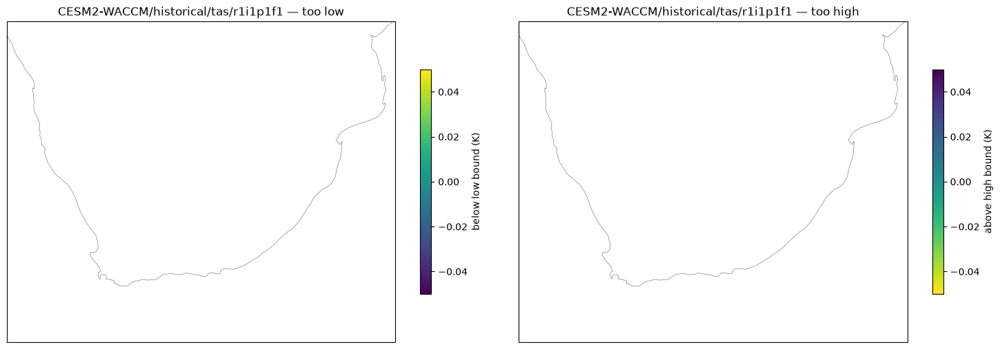

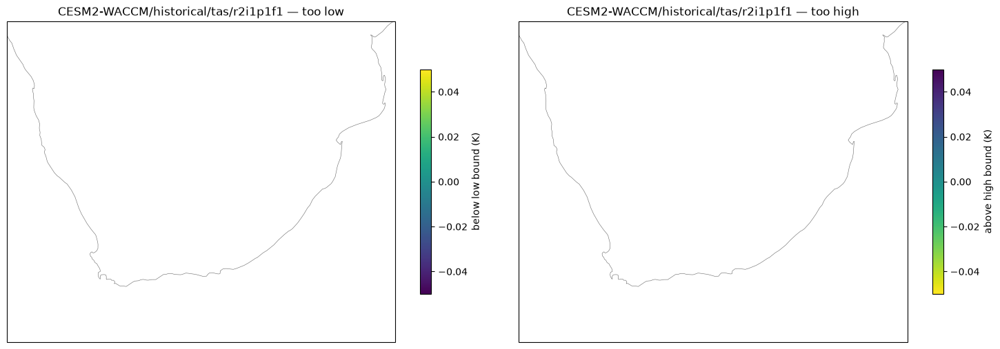

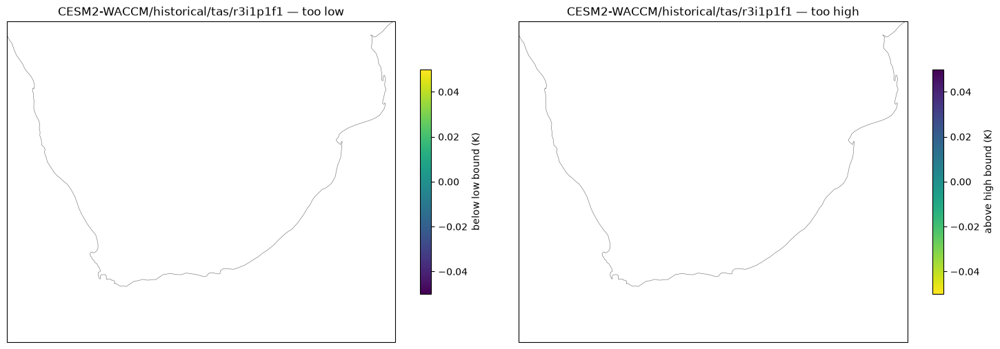

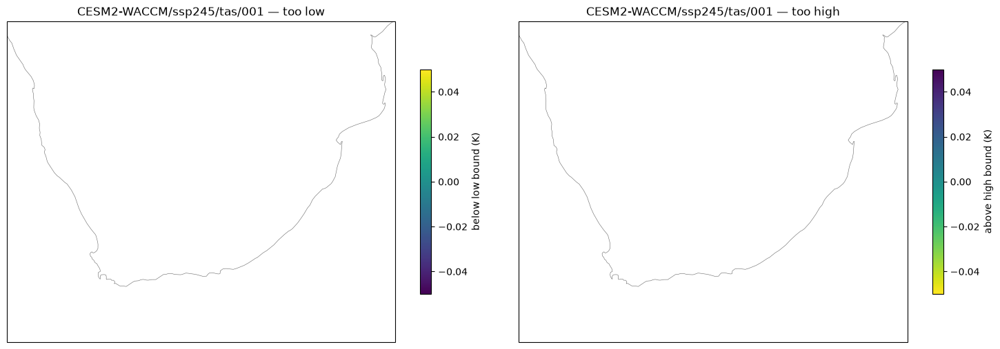

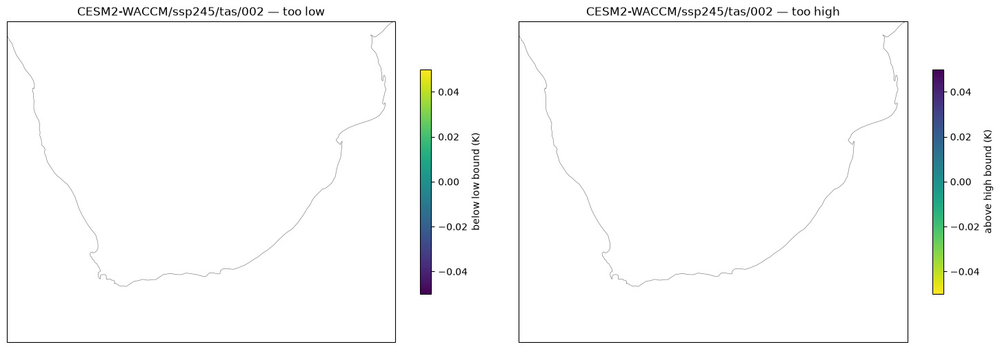

...

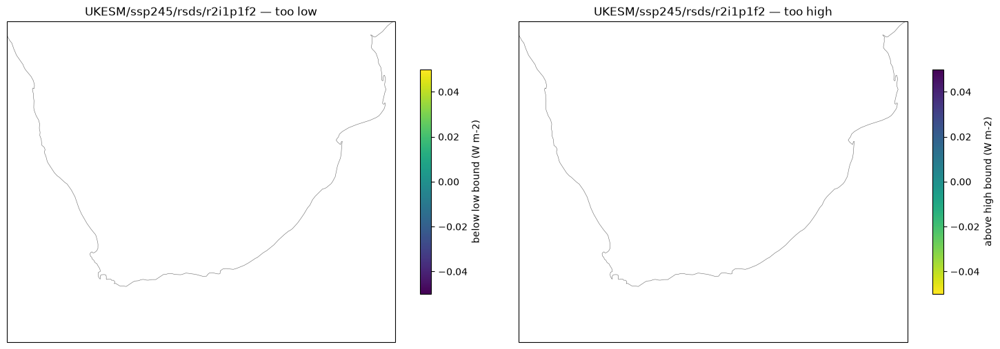

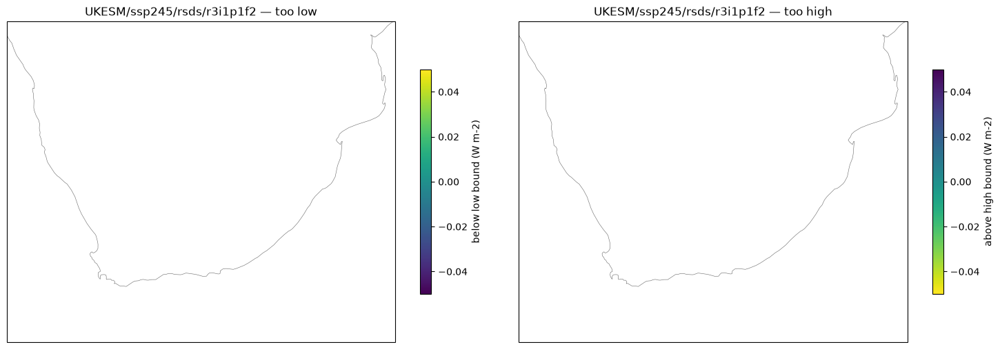

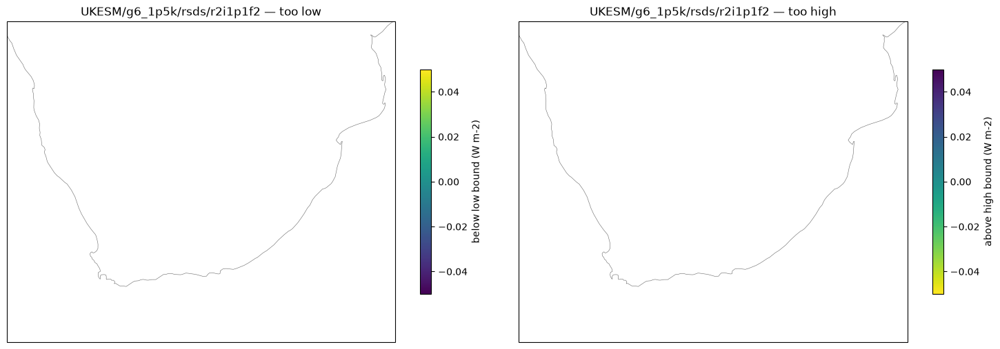

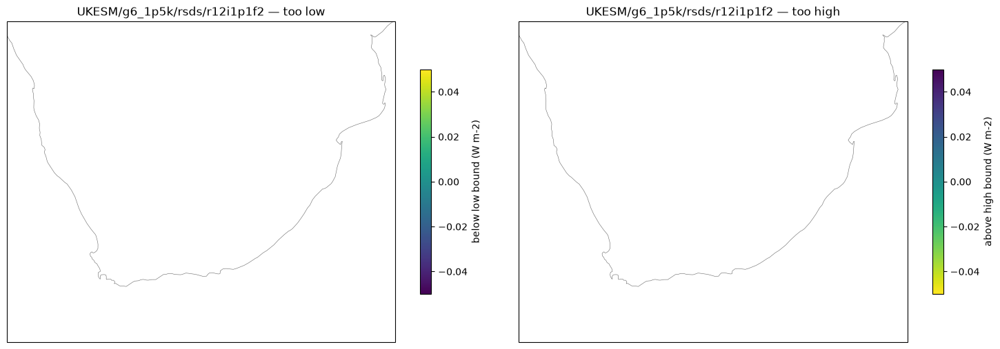

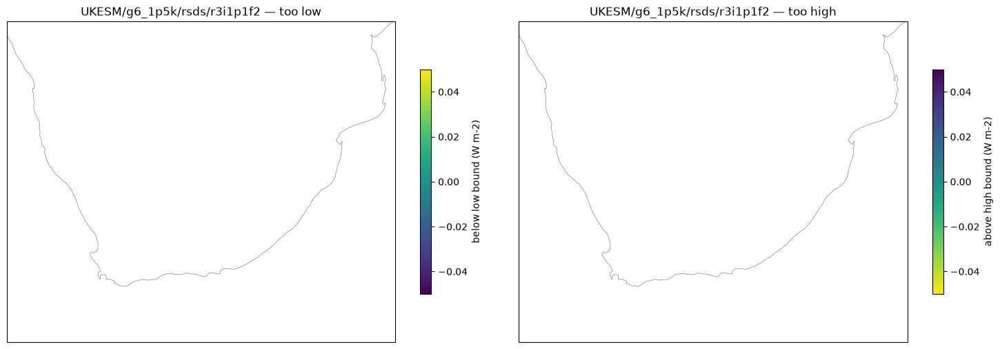

In [13]:
plot_exceedance_maps(stats)

### Drill-down helpers

Two sections below inspect individual grid cells: the deep dive, from the cached envelope, and Part 2,
from an envelope rebuilt in the current kernel. They share the functions defined here so the figures
and the flagging logic stay identical regardless of where the bounds came from. These functions now live in `srm.plotting`.

| Function | Purpose |
|---|---|
| `plot_region_zoom` | one zoomed map per ranked region, with a cross on the worst cell |
| `point_series` | every series for one grid cell, built **lazily** so many points fuse into one compute |
| `plot_point_panels` | the four-panel figure for one point, from already-computed series |

`point_series` returning lazy arrays is the point of the split. Resolving one point with seven
separate `.compute()` calls costs seven scheduler round-trips with the workers idle in between;
collecting the lazy dicts and calling `dask.compute` once lets every read for every point overlap.

In [14]:
# Any one leaf's `over` map, just to sanity-check the shape and range of what `stats` holds.
# Member ids differ by GCM/run, so pick the first available "pr" leaf rather than hardcoding one.
_example_key = next(key for key in stats if key[2] == "pr")
over_test = stats[_example_key].over
print(f"example leaf: {'/'.join(_example_key)}")
print("min:", float(over_test.min()), "max:", float(over_test.max()))
print("mean:", float(over_test.mean()), "std:", float(over_test.std()))

example leaf: CESM2-WACCM/historical/pr/r1i1p1f1
min: -0.0012657330371439457 max: 1.8747232388705015e-05
mean: -0.0003899342264048755 std: 0.00023686069471295923


In [15]:
from srm.plotting import plot_point_panels, plot_region_zoom, point_series

## Single-leaf deep dive

Part 1 answers whether any leaf is flagged. This section answers the follow-up question: for one
leaf, where are the flagged cells, and what does the record look like at a few of them. It reads the
artifact cache that Part 1 wrote instead of recomputing anything, so it runs in seconds and needs no
cluster.

The cache is what makes this cheap, not the single-leaf filter. Narrowing the check to one leaf
removes only the per-leaf reduction; the observed envelope is per *variable* and is paid in full no
matter how many leaves you ask for.

| Ingredient | Scope | Approx. read | Removed by picking one leaf? |
|---|---|---|---|
| Observed day-of-year envelope | per variable | ~70 GB | No |
| Downscaled leaf day-of-year reduction | per leaf | ~90 GB | Only for the other leaves |

A single-leaf recompute therefore costs roughly 40 % of the four-leaf batch, not 25 % of it, and
`functools.cache` on `obs_bounds_cached` does not change that: it memoizes the lazy graph, so it
dedupes within one `dask.compute` and carries nothing across a kernel restart. Only persisting the
computed values does.

The cheap half is still recomputed here. `leaf_bounds` adds the coarse-grid scenario delta to the
cached observed envelope, so the deep dive compares against exactly the bound Part 1 used, clamp
included, without storing a separate copy per leaf.

**To run this section on its own**, just run every cell from the top with `COMPUTE_MODE` left at
`auto`. Once the cache is populated, `auto` resolves to `cached`, no cluster is created, and "Running
the check" loads the committed leaf maps instead of recomputing them, so the whole notebook reaches
this section in seconds. There are no cells to skip and no ordering to remember, which matters because
a forgotten skip used to mean 30 VMs and a multi-hour reduction.

In [16]:
# Set the leaf and how much of it to inspect, then run this section on its own.
DEEP_DIVE_GCM = "UKESM"
DEEP_DIVE_SCENARIO = "ssp245"
DEEP_DIVE_VAR = "tasmax"
DEEP_DIVE_MEMBER = "r3i1p1f2"

N_REGIONS = 6  # coherent regions to rank, zoom into, and pick drill-down points from
MIN_REGION_CELLS = 4  # drop components smaller than this: the isolated coastline / sea-ice flecks
N_POINTS = 3  # points to resolve in one compute, taken from the worst cell of the top regions

deep_dive_key = (DEEP_DIVE_GCM, DEEP_DIVE_SCENARIO, DEEP_DIVE_VAR, DEEP_DIVE_MEMBER)
if deep_dive_key not in leaves:
    raise KeyError(
        f"{'/'.join(deep_dive_key)} not found among discovered leaves -- see the leaf list above"
    )
deep_dive_units, deep_dive_scale = display_units(DEEP_DIVE_VAR)

# Both reads come from DEEP_DIVE_GCM's cache: a few MB of exceedance maps, and an envelope left
# lazy so a single-point selection later fetches one chunk instead of the whole ~3 GB.
deep_dive_stats = load_exceedance_maps(DEEP_DIVE_GCM, keys=[deep_dive_key])
deep_dive_map = deep_dive_stats[deep_dive_key]
deep_dive_low, deep_dive_high = leaf_bounds(
    deep_dive_key, *load_doy_envelope(DEEP_DIVE_GCM, DEEP_DIVE_VAR)
)

print(f"{'/'.join(deep_dive_key)}  (cache: {cache_store_uri(DEEP_DIVE_GCM)}, branch {BRANCH})")
print(
    f"  too high: {float(deep_dive_map.frac_area_too_high):.5%} of area, worst "
    f"{float(deep_dive_map.diff_gt_doy_max) * deep_dive_scale:.3f} {deep_dive_units}"
)
print(
    f"  too low:  {float(deep_dive_map.frac_area_too_low):.5%} of area, worst "
    f"{float(deep_dive_map.diff_lt_doy_min) * deep_dive_scale:.3f} {deep_dive_units}"
)

UKESM/ssp245/tasmax/r3i1p1f2  (cache: s3://carbonplan-scratch/srm/qaqc/UKESM-ERA5-lat-38to-19_lon13to36.icechunk, branch full-regional-run-issue-534)
  too high: 0.00000% of area, worst -1.062 K
  too low:  0.16757% of area, worst -0.686 K


In [17]:
# Connected components of the flagged mask, ranked by exceedance magnitude. `n_cells` is what
# separates a coherent patch worth investigating from an isolated fleck, and `min_cells` drops the
# flecks outright. Components touching across the antimeridian are merged into one region; for those
# the lon_min/lon_max box is meaningless, which `wraps_lon` flags.
regions_high = find_exceedance_regions(
    deep_dive_map.over,
    direction="high",
    min_cells=MIN_REGION_CELLS,
    top_n=N_REGIONS,
    scale=deep_dive_scale,
)
regions_low = find_exceedance_regions(
    deep_dive_map.under,
    direction="low",
    min_cells=MIN_REGION_CELLS,
    top_n=N_REGIONS,
    scale=deep_dive_scale,
)

for label, regions in [
    ("above the high bound", regions_high),
    ("below the low bound", regions_low),
]:
    print(f"Top {N_REGIONS} regions {label}, magnitudes in {deep_dive_units}:")
    print(regions.to_string(index=False) if len(regions) else "  none")
    print()

Top 6 regions above the high bound, magnitudes in K:
  none

Top 6 regions below the low bound, magnitudes in K:
 region  n_cells  area_frac  worst_value  worst_lat  worst_lon  centroid_lat  centroid_lon  lat_min  lat_max  lon_min  lon_max  wraps_lon
      1        5   0.000698    -0.686005     -23.25      14.25       -23.250       14.2500   -23.75   -22.75    14.25    14.25      False
      2        4   0.000559    -0.422546     -29.25      16.75       -29.375       16.6875   -29.75   -29.00    16.50    16.75      False



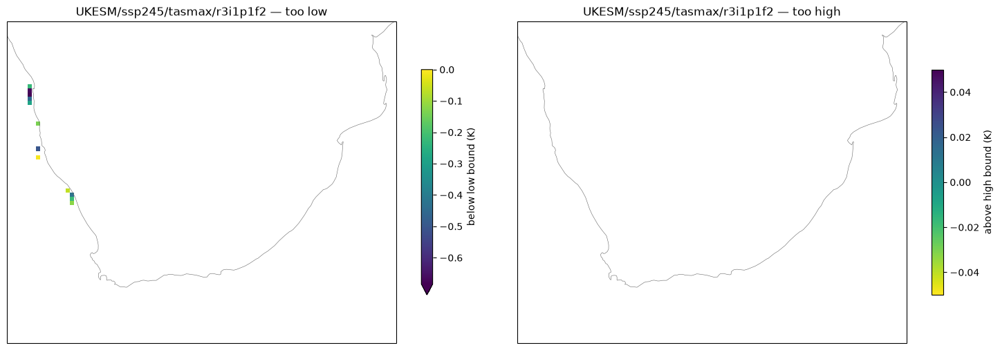

no high regions to plot


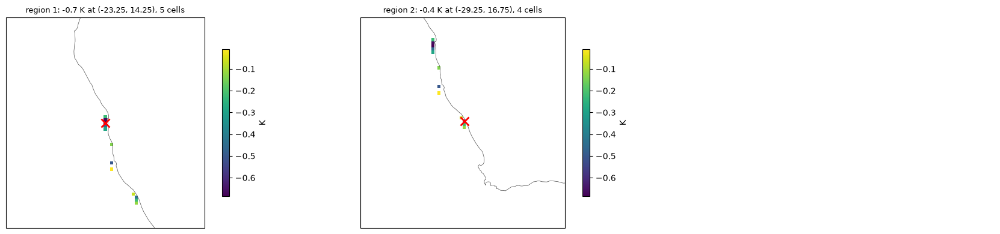

In [28]:
# The global pair for context, then a zoom per ranked region with a cross on its worst cell.
plot_exceedance_maps(deep_dive_stats)
plot_region_zoom(
    deep_dive_map.over,
    regions_high,
    direction="high",
    units=deep_dive_units,
    scale=deep_dive_scale,
)
plot_region_zoom(
    deep_dive_map.under,
    regions_low,
    direction="low",
    units=deep_dive_units,
    scale=deep_dive_scale,
)

### Example points in the flagged regions

The worst cell of each top-ranked region becomes a drill-down point. Every series for every point is
built lazily and evaluated in one `dask.compute`, so the reads overlap rather than queueing: the same
work issued as separate `.compute()` calls per point costs a scheduler round-trip each with the
workers idle in between. Switch `deep_dive_regions` to `regions_low` to inspect the lower bound
instead.

In [29]:
%%time
deep_dive_regions = regions_high  # or regions_low, to inspect the lower bound instead

deep_dive_points = [
    (region.worst_lat, region.worst_lon) for region in deep_dive_regions.head(N_POINTS).itertuples()
]
if not deep_dive_points:
    raise ValueError(
        "no regions survived MIN_REGION_CELLS -- lower it, or switch deep_dive_regions"
    )

# srm.plotting.point_series/plot_point_panels are GCM-agnostic: they take a (scenario, variable,
# member) key and a `historical_member` callable, not a GCM. DEEP_DIVE_GCM is fixed for this whole
# section, so it is bound in here via functools.partial rather than threaded through their key.
_deep_dive_leaf_key = deep_dive_key[1:]
_deep_dive_historical_member = functools.partial(historical_member, DEEP_DIVE_GCM)

# One graph for every point and every series. The bounds come from the cached envelope, so nothing
# here re-reduces the observation record.
lazy = {
    point: point_series(
        _deep_dive_leaf_key,
        *point,
        deep_dive_low,
        deep_dive_high,
        tree=trees[DEEP_DIVE_GCM],
        leaves=leaves_for(DEEP_DIVE_GCM),
        obs_fine=obs_fine,
        gcm=CATALOGS[DEEP_DIVE_GCM],
        historical_member=_deep_dive_historical_member,
    )
    for point in deep_dive_points
}
(deep_dive_series,) = dask.compute(lazy)
print(f"Resolved {len(deep_dive_series)} point(s) in one compute\n")

for (point_lat, point_lon), series in deep_dive_series.items():
    n_flagged = plot_point_panels(
        series,
        _deep_dive_leaf_key,
        point_lat,
        point_lon,
        units=deep_dive_units,
        scale=deep_dive_scale,
    )
    n_days = series["downscaled"].sizes["time"]
    print(f"({point_lat:.2f}, {point_lon:.2f}): {n_flagged} of {n_days} days outside the envelope")

CPU times: user 90 μs, sys: 764 μs, total: 854 μs
Wall time: 870 μs


ValueError: no regions survived MIN_REGION_CELLS -- lower it, or switch deep_dive_regions

## Part 2 — single-point drill-down

A map tells you *where* a leaf leaves the envelope; to understand *why*, it helps to look at one
grid cell across the whole record. Below we pick one flagged leaf and one point and plot the
downscaled daily values against the plausible envelope and the underlying inputs (raw scenario GCM,
raw historical GCM, ERA5 observations, and the coarse debiased output). Change `drill_key` and the
point to inspect any cell; `_preferred` in the next cell is just a hint (see the fallback logic
there) about which GCM/leaf to start from, not a guarantee. Every series in the figure is
converted to the leaf's reporting units before plotting, so e.g. an `rsds` drill-down reads in
W m⁻² on the same scale as the summary table above.

This section rebuilds the envelope in the current kernel, so it requires "Running the check" above to have been run and a cluster to be up. The deep dive is the cheaper route to the same figure for a leaf whose artifacts are already cached; this one stays useful when the batch is already in memory and you want a leaf chosen from the full summary.

In [20]:
# Pick a leaf to inspect more closely (one that was flagged). This reads `stats` and `summary`
# from the full Part 1 run; it does not use the deep-dive cache.
# Member ids and which leaves are flagged differ by GCM/run, so this is just a hint -- the fallback
# below picks the first flagged leaf, or the first leaf, if it does not match.
_preferred = ("UKESM", "ssp245", "tasmax", "r3i1p1f2")

In [21]:
ilat, ilon = -22, 21.5  # example point (store coordinate convention)

In [22]:
# Default to a known flagged leaf if present, else the first flagged leaf, else the first leaf.
if _preferred in stats:
    drill_key = _preferred
else:
    _flagged = summary.index[~summary["pass"]]
    drill_key = tuple(_flagged[0]) if len(_flagged) else next(iter(stats))
drill_gcm, drill_scenario, drill_var, drill_member = drill_key
drill_units, drill_scale = display_units(drill_var)

print(f"Drilling into {'/'.join(drill_key)} at lat={ilat}, lon={ilon}")

# point_series/historical_member below are keyed by (scenario, var, member); drill_gcm is fixed for
# this cell, so it is bound in rather than threaded through the key (see the deep-dive section above).
_drill_leaf_key = drill_key[1:]
_drill_historical_member = functools.partial(historical_member, drill_gcm)

# Rebuild this leaf's bounds from the in-kernel observed envelope, then resolve every series for the
# point in ONE dask.compute. dask prunes the graph to the one column, but the rebuilt envelope still
# pulls a full spatial chunk through the whole observation record; the deep dive above avoids that by
# reading the committed envelope out of the cache instead.
# In a cached run there is no cluster to rebuild the envelope on, and no reason to: the committed
# copy is the same array. A full run keeps using the in-kernel envelope it already has in its graph.
_drill_obs = (
    load_doy_envelope(drill_gcm, drill_var)
    if RESOLVED_MODE == "cached"
    else obs_bounds_cached(drill_var)
)
drill_low, drill_high = leaf_bounds(drill_key, *_drill_obs)
(drill_series,) = dask.compute(
    point_series(
        _drill_leaf_key,
        ilat,
        ilon,
        drill_low,
        drill_high,
        tree=trees[drill_gcm],
        leaves=leaves_for(drill_gcm),
        obs_fine=obs_fine,
        gcm=CATALOGS[drill_gcm],
        historical_member=_drill_historical_member,
    )
)

Drilling into UKESM/ssp245/tasmax/r3i1p1f2 at lat=-22, lon=21.5


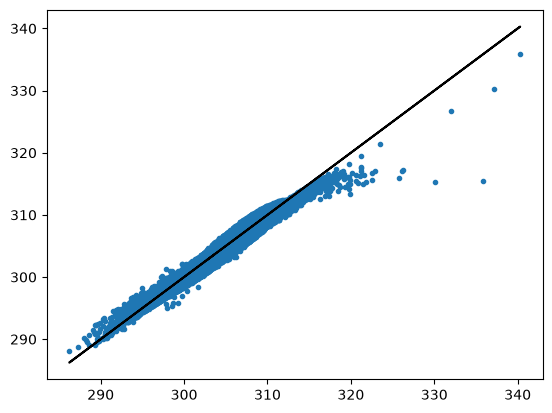

In [23]:
plt.plot(drill_series["raw_scenario"], drill_series["coarse_debiased"], ".")
plt.plot(drill_series["raw_scenario"], drill_series["raw_scenario"], "-k")

In [24]:
multiples = drill_series["coarse_debiased"].to_series().value_counts()

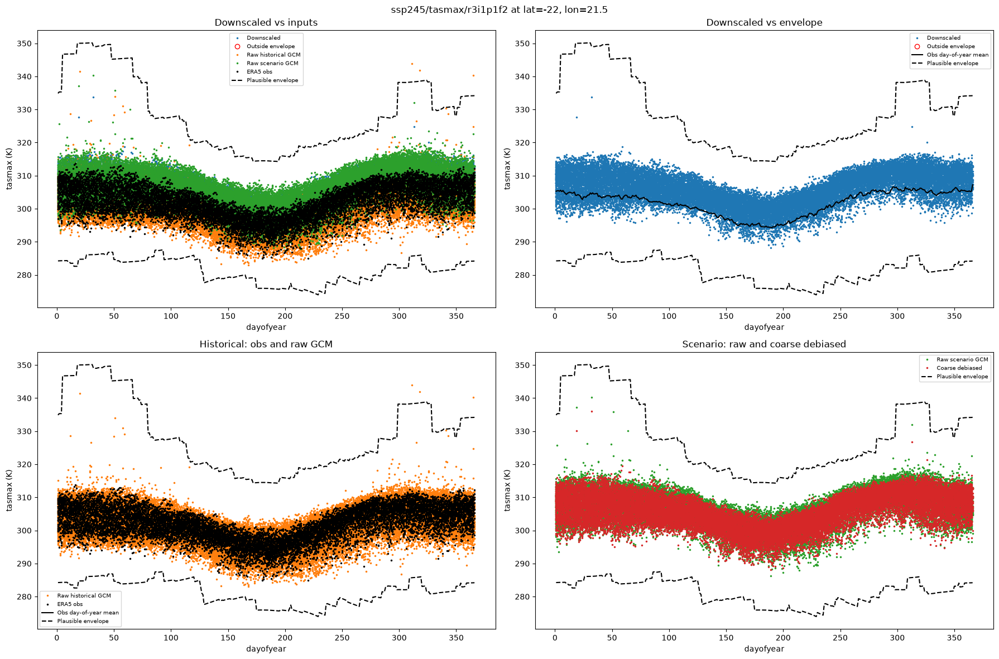

Flagged days at this point: 0 of 31046


In [26]:
n_flagged = plot_point_panels(
    drill_series, _drill_leaf_key, ilat, ilon, units=drill_units, scale=drill_scale
)
print(f"Flagged days at this point: {n_flagged} of {drill_series['downscaled'].sizes['time']}")

## Summary

Each leaf — now identified by GCM as well as scenario, variable, and member — reports the fraction of
the domain that ever leaves its per-day-of-year plausible envelope, in each direction, together with
the largest exceedance — in kelvin, mm day⁻¹ for precipitation, or W m⁻² for shortwave radiation — and
a pass flag at the 2 % threshold. Because the envelope is intentionally wide and day-of-year specific,
a passing leaf is strong evidence that the downscaling did not invent locally impossible values, while
a flagged leaf points to specific cells and days to inspect with the drill-down rather than to an
automatic failure. See the `summary` table above for this run's actual numbers, broken out by `gcm`
alongside `scenario`, `variable`, and `member`; a leaf's disposition can differ by GCM even for the
same scenario and variable, since each GCM's own catalog and lineage feed its bounds.

The refactor keeps the original check's approach but extends it across every GCM the regional run
covers: it discovers leaves from each GCM's own store instead of a hand-written list, builds every
reduction lazily, computes the expensive observed envelope once per `(gcm, variable)`, and evaluates
each `(gcm, variable)`'s leaves in one `dask.compute` on a fixed, on-demand cluster. Batching by
`(gcm, variable)` keeps each pair's leaves running in parallel while bounding peak memory to one pair
at a time, and the fixed on-demand pool removes the worker churn — spot reclamation and adaptive
downscaling — that would otherwise lose reduction partials mid-compute.

In [ ]:
if cluster is not None:
    cluster.shutdown()
else:
    print("no cluster was created (cached run); nothing to shut down")